In [19]:
from data import feeder, substations
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
all_substations = substations()

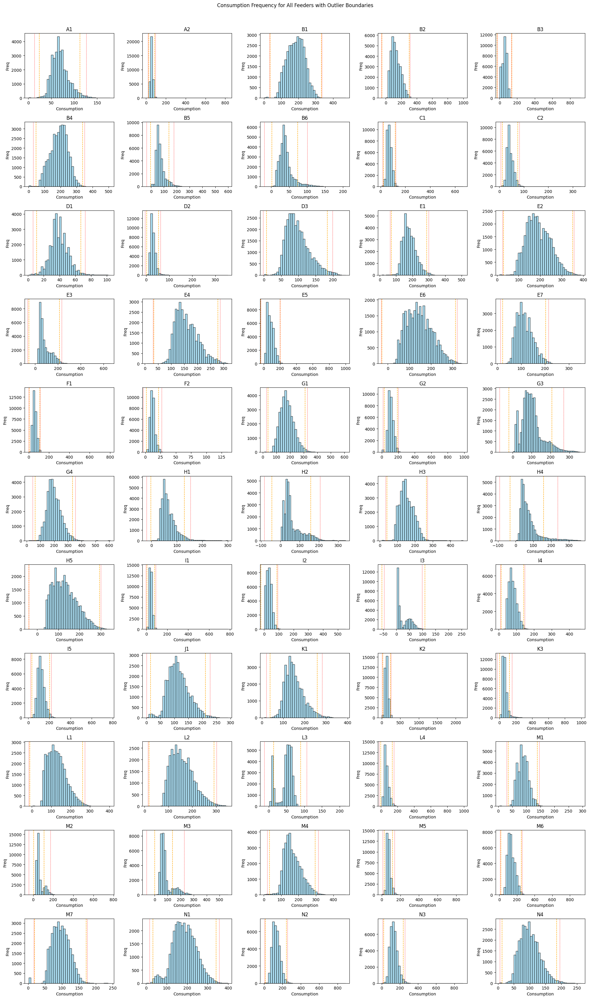

In [16]:
substations = all_substations.get_substations()
feeder_list = [feeder for station in substations for feeder in station.get_feeders()]
n_feed = len(feeder_list)
ncols = 5
nrows = int(np.ceil(n_feed / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*3), sharex=False, sharey=False)
axes = axes.flatten()

for idx, _feeder in enumerate(feeder_list):
    df_f = _feeder.get_consumption_data()
    cons_col = 'consumption'  # Adjust if your consumption column has a different name
    values = df_f[cons_col].dropna()
    if len(values) == 0:
        continue
    # IQR boundaries
    q1 = values.quantile(0.25)
    q3 = values.quantile(0.75)
    iqr = q3 - q1
    iqr_low = q1 - 1.5 * iqr
    iqr_high = q3 + 1.5 * iqr
    # Z-score boundaries
    mean = values.mean()
    std = values.std()
    z_low = mean - 3 * std
    z_high = mean + 3 * std
    ax = axes[idx]
    ax.hist(values, bins=40, color='skyblue', edgecolor='k', alpha=0.7)
    ax.axvline(iqr_low, color='orange', linestyle='--', linewidth=1)
    ax.axvline(iqr_high, color='orange', linestyle='--', linewidth=1)
    ax.axvline(z_low, color='red', linestyle=':', linewidth=1)
    ax.axvline(z_high, color='red', linestyle=':', linewidth=1)
    ax.set_title(_feeder.feeder_id)
    ax.set_xlabel('Consumption')
    ax.set_ylabel('Freq')
# Hide unused axes
for j in range(idx+1, len(axes)):
    axes[j].set_visible(False)
plt.tight_layout()
plt.suptitle("Consumption Frequency for All Feeders with Outlier Boundaries", y=1.02)
plt.show()

In [21]:
feeders_to_plot = ["M7", "N1", "M2", "L3", "I3", "G3"]

for feeder_id in feeders_to_plot:
    temp = feeder(feeder_id)
    temp.plot()


Plotted data statistics for Feeder M7:
  Date range: 2017-01-01 00:00 to 2020-12-31 23:00
  Total records: 35,040
  Non-null records: 34,556
  Missing records: 484
  Mean consumption: 95.51
  Min consumption: 2.00
  Max consumption: 242.00



Plotted data statistics for Feeder N1:
  Date range: 2017-01-01 00:00 to 2020-12-31 23:00
  Total records: 35,016
  Non-null records: 34,119
  Missing records: 897
  Mean consumption: 187.06
  Min consumption: 2.00
  Max consumption: 398.00



Plotted data statistics for Feeder M2:
  Date range: 2017-01-01 00:00 to 2020-12-31 23:00
  Total records: 35,040
  Non-null records: 34,624
  Missing records: 416
  Mean consumption: 64.22
  Min consumption: 3.00
  Max consumption: 765.00



Plotted data statistics for Feeder L3:
  Date range: 2017-01-01 00:00 to 2020-12-31 23:00
  Total records: 35,016
  Non-null records: 34,211
  Missing records: 805
  Mean consumption: 47.24
  Min consumption: 2.00
  Max consumption: 216.00



Plotted data statistics for Feeder I3:
  Date range: 2017-01-01 00:00 to 2020-11-22 23:00
  Total records: 34,104
  Non-null records: 33,014
  Missing records: 1,090
  Mean consumption: 25.92
  Min consumption: 2.00
  Max consumption: 256.00



Plotted data statistics for Feeder G3:
  Date range: 2017-01-01 00:00 to 2020-12-31 23:00
  Total records: 35,016
  Non-null records: 34,081
  Missing records: 935
  Mean consumption: 99.55
  Min consumption: 2.00
  Max consumption: 360.00
